In [4]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
import os
import sys
import torch.optim as optim

import seaborn as sns

sys.path.insert(0, '/home/labs/rudich/gavriel/helpers/')
#from visual import *
from data_handlers import *

sys.path.insert(0, '/home/labs/rudich/gavriel/helpers/')
from plotting import *

sys.path.insert(0, '/home/labs/rudich/gavriel/helpers_gavriel/')
from funcs import *


import plotly.offline as pyo
pyo.init_notebook_mode()
import xarray as xr
import os
import pickle
import cartopy.crs as ccrs
import cartopy as crs
from torch.utils.data import random_split
from torch.utils.data import WeightedRandomSampler
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR
from einops import rearrange
from torchinfo import summary
from datetime import datetime, timedelta
# from torchgeo.samplers import RandomGeoSampler

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [6]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

In [7]:
#DUST_INSITU
# data_rea=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/new_reanalysis_data[54,81].pkl")
# data_fore=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/new_forecast_data[54,81].pkl")
timestamps_rea=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/timestamps_rea.pkl")
timestamps_fore=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/timestamps_forecast.pkl")
meta_data_fore=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/meta_data_fore")
meta_data_rea=torch.load("/home/labs/rudich/gavriel/testing_data_pressure/meta_data_rea")
data_rea_with_zeros=torch.load("/home/labs/rudich/gavriel/domain_adaptation_fore_rea/data_reanalysis_with_zeros_tensors")
data_fore_with_zeros=torch.load("/home/labs/rudich/gavriel/domain_adaptation_fore_rea/data_forecast_with_zeros_tensors")

# #DUST_INSITU
dust_dir = "/home/labs/rudich/Collaboration/dust_prediction/data/dust_61368_108_2_339/"
labels_all = torch.load(dust_dir+"dust_61368_108_2_339_full_tensor.pkl")
timestamps_labels = torch.load(dust_dir+"dust_61368_108_2_339_full_timestamps.pkl")
dust_meta_data = torch.load("/home/labs/rudich/Collaboration/dust_prediction/data/dust_61368_108_2_339/dust_61368_108_2_339_metadata.pkl")

In [8]:
dates_rea_fore = timestamps_rea.union(timestamps_fore)
print(dates_rea_fore)
shared_timestamps_idxs, shared_timestamps = sync_timestamps([dates_rea_fore, # pd.DatetimeIndex vector of len raw_inputs.shape[0]
                                                             timestamps_labels]) # pd.DatetimeIndex vector of len raw_outputs.shape[0]
len(shared_timestamps_idxs[0])

DatetimeIndex(['2003-01-02 00:00:00+00:00', '2003-01-02 12:00:00+00:00',
               '2003-01-03 00:00:00+00:00', '2003-01-03 12:00:00+00:00',
               '2003-01-04 00:00:00+00:00', '2003-01-04 12:00:00+00:00',
               '2003-01-05 00:00:00+00:00', '2003-01-05 12:00:00+00:00',
               '2003-01-06 00:00:00+00:00', '2003-01-06 12:00:00+00:00',
               ...
               '2023-05-19 00:00:00+00:00', '2023-05-19 12:00:00+00:00',
               '2023-05-20 00:00:00+00:00', '2023-05-20 12:00:00+00:00',
               '2023-05-21 00:00:00+00:00', '2023-05-21 12:00:00+00:00',
               '2023-05-22 00:00:00+00:00', '2023-05-22 12:00:00+00:00',
               '2023-05-23 00:00:00+00:00', '2023-05-23 12:00:00+00:00'],
              dtype='datetime64[ns, UTC]', length=14894, freq='12H')


  0%|          | 0/2 [00:00<?, ?it/s]

13148

In [11]:
x=np.array(shared_timestamps_idxs)
x=x[[False,True,False,False,False]]
x

array([2])

In [90]:
class encoder_decoder_dataset(Dataset):
    def __init__(self, data_fore, data_rea, shared_timestamps ,pressure=0,selected_channels=[],selected_levels=[]):
        
    
        self.data_fore = data_fore
        self.data_rea = data_rea
        self.shared_timestamps=timestamps_rea
        self.pressure=pressure
        print(self.data_fore.shape)
        
        self.data_fore=self.data_fore[:,:,0]
        if len(selected_channels)!=0:
            self.data_fore=self.data_fore[:,selected_channels]
            self.data_rea=self.data_rea[:,selected_channels]
            
        
        print(self.data_fore.shape,self.data_rea.shape)

        self.data_rea=self.data_rea
        
        mask = (self.data_rea.sum([1, 2, 3,4]) != 0) * (self.data_fore.sum([1, 2, 3,4])!=0)
        self.data_fore=self.data_fore[mask]
        self.data_rea=self.data_rea[mask]
        print(self.data_fore.shape)
        
        self.data_fore = rearrange(self.data_fore, 'b c le h w -> b (c le) h w') 
        self.data_rea = rearrange(self.data_rea, 'b c le h w -> b (c le) h w') 
        print(self.data_fore.shape,self.data_rea.shape)    
        
        #norm by channels and model levels:
        means_rea = self.data_rea.mean([0,2,3])[None,:,None,None]
        means_fore = self.data_fore.mean([0,2,3])[None,:,None,None]

        std_rea = self.data_rea.std([0,2,3])[None,:,None,None]
        std_fore = self.data_fore.std([0,2,3])[None,:,None,None]

        self.data_rea_scaled = (self.data_rea - means_rea)/std_rea
        self.data_fore_scaled = (self.data_fore - means_fore)/std_fore

        
    def __len__(self):
        return self.data_fore.shape[0]
    
    def __getitem__(self, idx):
        
        fore=self.data_fore_scaled[idx]
        rea=self.data_rea_scaled[idx]
        return fore, rea, str(self.shared_timestamps[idx])

In [91]:
index_2017=np.where(timestamps_rea=='2016-07-01 00:00:00+00:00')[0][0]
index_2019=np.where(timestamps_rea=='2019-07-01 00:00:00+00:00')[0][0]

index_2020=np.where(timestamps_rea=='2020-01-01 00:00:00+00:00')[0][0]
index_2021=np.where(timestamps_rea=='2021-12-31 00:00:00+00:00')[0][0]
index_2023=np.where(timestamps_rea=='2022-12-31 00:00:00+00:00')[0][0]


# index_2020=np.where(timestamps_rea.year==2020)[0][0]
# index_2021=np.where(timestamps_rea.year==2021)[0][0]

dates_rea_fore = timestamps_rea.union(timestamps_fore)

#train

train_data_fore=data_fore_with_zeros[index_2017:index_2019]
train_data_rea=data_rea_with_zeros[index_2017:index_2019]

dates_rea_fore_train=dates_rea_fore[index_2017:index_2019]
shared_timestamps_idxs_train, shared_timestamps_train = sync_timestamps([dates_rea_fore_train, # pd.DatetimeIndex vector of len raw_inputs.shape[0]
                                                             timestamps_labels])


train_dataset_1 = encoder_decoder_dataset(train_data_fore,train_data_rea,shared_timestamps_train,selected_levels=[0])

train_data_fore=data_fore_with_zeros[index_2020:index_2021]
train_data_rea=data_rea_with_zeros[index_2020:index_2021]

dates_rea_fore_train=dates_rea_fore[index_2020:index_2021]
shared_timestamps_idxs_train, shared_timestamps_train = sync_timestamps([dates_rea_fore_train, # pd.DatetimeIndex vector of len raw_inputs.shape[0]
                                                             timestamps_labels])

train_dataset_2 = encoder_decoder_dataset(train_data_fore,train_data_rea,shared_timestamps_train,selected_levels=[0])

#test

test_data_fore=data_fore_with_zeros[index_2021:index_2023]
test_data_rea=data_rea_with_zeros[index_2021:index_2023]

dates_rea_fore_test=dates_rea_fore[index_2021:index_2023]
shared_timestamps_idxs_test, shared_timestamps_test = sync_timestamps([dates_rea_fore_test, # pd.DatetimeIndex vector of len raw_inputs.shape[0]
                                                             timestamps_labels])

test_dataset = encoder_decoder_dataset(test_data_fore,test_data_rea,shared_timestamps_test,selected_levels=[0])


train_dataset=train_dataset_1+train_dataset_2

  0%|          | 0/2 [00:00<?, ?it/s]

torch.Size([2190, 17, 3, 3, 54, 81])
torch.Size([2190, 17, 3, 54, 81]) torch.Size([2190, 17, 3, 54, 81])
torch.Size([2164, 17, 3, 54, 81])
torch.Size([2164, 51, 54, 81]) torch.Size([2164, 51, 54, 81])


  0%|          | 0/2 [00:00<?, ?it/s]

torch.Size([1460, 17, 3, 3, 54, 81])
torch.Size([1460, 17, 3, 54, 81]) torch.Size([1460, 17, 3, 54, 81])
torch.Size([1460, 17, 3, 54, 81])
torch.Size([1460, 51, 54, 81]) torch.Size([1460, 51, 54, 81])


  0%|          | 0/2 [00:00<?, ?it/s]

torch.Size([730, 17, 3, 3, 54, 81])
torch.Size([730, 17, 3, 54, 81]) torch.Size([730, 17, 3, 54, 81])
torch.Size([730, 17, 3, 54, 81])
torch.Size([730, 51, 54, 81]) torch.Size([730, 51, 54, 81])


### we want to check what is the distance from the reanalysis to forecast (mse between the reanalysis data to the forecast data)

In [92]:
list_fore = []
list_rea = []
for data in train_dataset:
    fore, rea, time = data
    list_fore.append(fore) # shape: ([3, 17, 54, 81])
    list_rea.append(rea)
list_fore1 = torch.stack(list_fore)
list_rea1 = torch.stack(list_rea)

list_fore_test = []
list_rea_test = []
for data in test_dataset:
    fore, rea, time = data
    list_fore_test.append(fore) # shape: ([3, 17, 54, 81])
    list_rea_test.append(rea)
list_fore1_test = torch.stack(list_fore_test)
list_rea1_test = torch.stack(list_rea_test)


### mse (reanalysis forecast)

In [93]:
print(((list_fore1-list_rea1)**2).mean(),((list_fore1_test-list_rea1_test)**2).mean())

tensor(0.8661) tensor(0.8911)


In [94]:
batch_size=32

train_dataloader = DataLoader(train_dataset, batch_size=batch_size,shuffle=True)#,sampler=sampler_train)
val_dataloader = DataLoader(test_dataset, batch_size=batch_size)

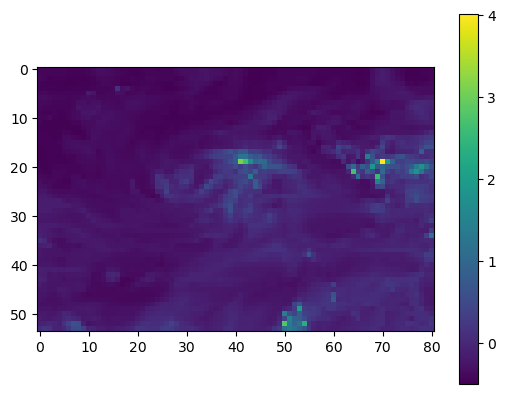

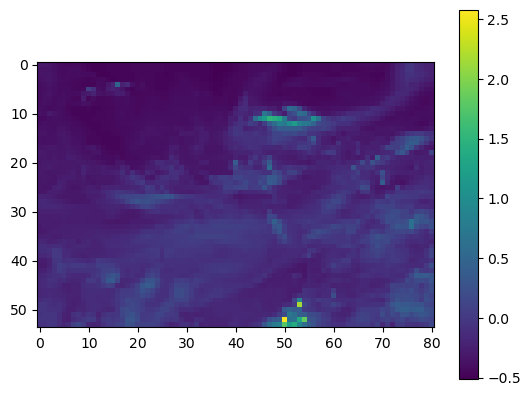

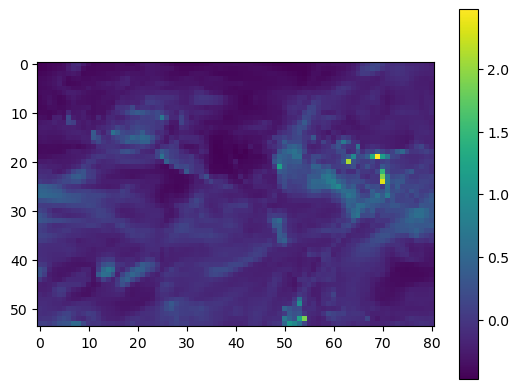

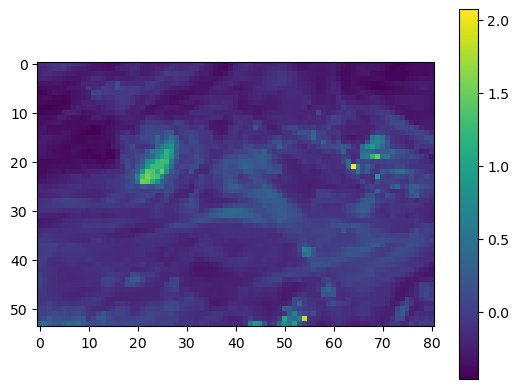

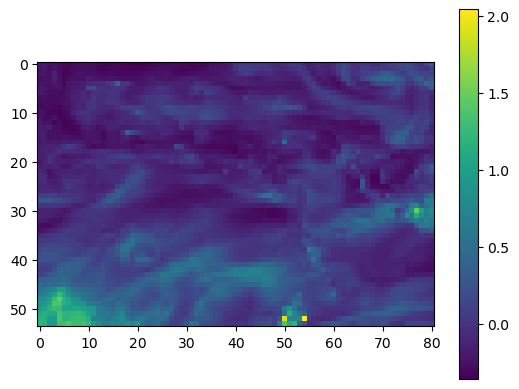

...

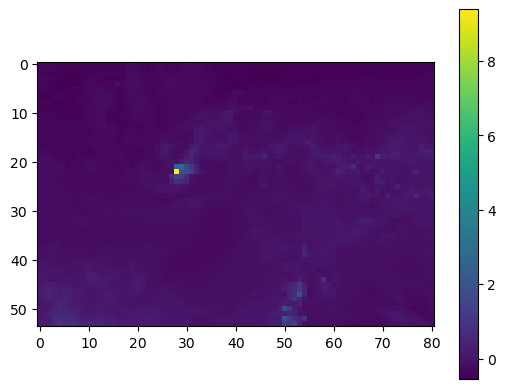

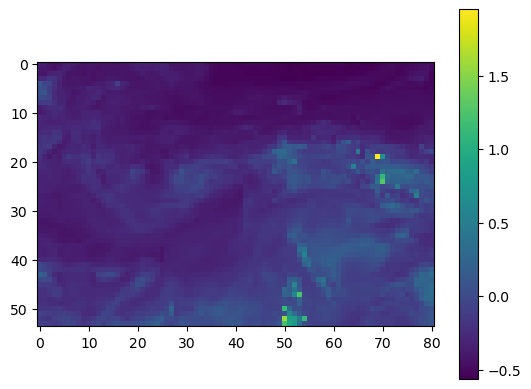

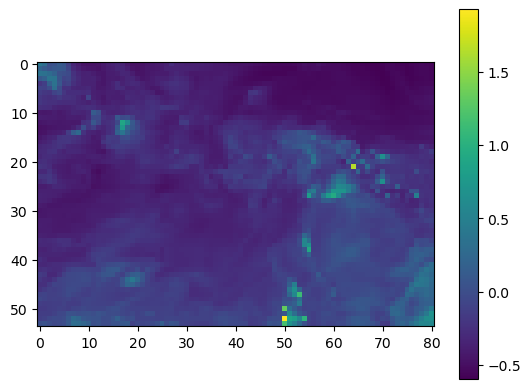

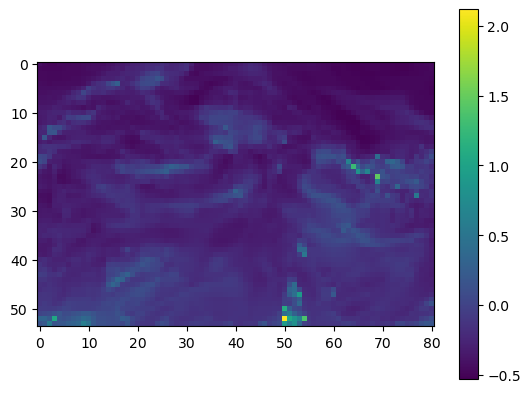

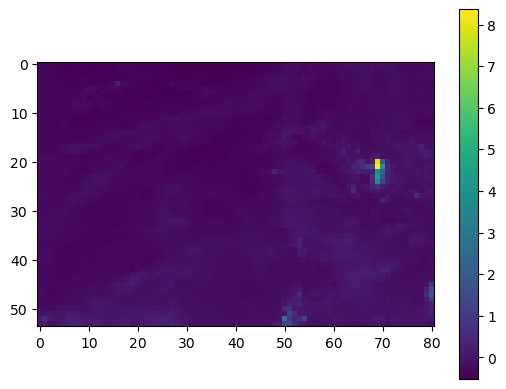

In [95]:
for x in val_dataloader:
    plt.imshow(x[0][0].mean(0))
    plt.colorbar()
    plt.show()


### first we wil check what is the ability of the vae to move from analysis to forecast

In [96]:
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        # Encoder
        self.enc_conv1 = nn.Conv2d(51, 54, kernel_size=4, stride=2, padding=1) 
        self.enc_conv2 = nn.Conv2d(54, 62, kernel_size=4, stride=2, padding=1)  
        self.enc_conv3 = nn.Conv2d(62, 80, kernel_size=4, stride=2, padding=1)
        self.enc_conv4 = nn.Conv2d(80, 96, kernel_size=4, stride=2, padding=1)
        self.fc1 = nn.Linear(96*3*5, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc2_mu = nn.Linear(128, 17)
        self.fc2_logvar = nn.Linear(128, 17)
        
        # Decoder
        self.fc3 = nn.Linear(17, 128)
        self.fc4 = nn.Linear(128, 96*3*5)
        self.dec_conv1 = nn.ConvTranspose2d(96*2, 80, kernel_size=4, stride=2, padding=1)
        self.dec_conv2 = nn.ConvTranspose2d(80*2, 62, kernel_size=4, stride=2, padding=1)  
        self.dec_conv3 = nn.ConvTranspose2d(62*2, 54, kernel_size=4, stride=2, padding=1)  
        self.dec_conv4 = nn.ConvTranspose2d(54*2, 20, kernel_size=4, stride=2, padding=1)   
        self.last_conv= nn.ConvTranspose2d(71,51 , kernel_size=3, stride=1, padding=1)   # with the channel of the input
        
    def encode(self, x):
        h1 = torch.relu(self.enc_conv1(x))
        h2 = torch.relu(self.enc_conv2(h1))
        h3 = torch.relu(self.enc_conv3(h2))
        h4 = torch.relu(self.enc_conv4(h3))
        h = h4.view(-1,  96*3*5)
        h = torch.relu(self.fc1(h))
        h = torch.relu(self.fc2(h))
        return self.fc2_mu(h), self.fc2_logvar(h) ,[h4,h3,h2,h1]
    
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std
    
    def decode(self, z,in_x,layers):
        h = torch.relu(self.fc3(z))
        h = torch.relu(self.fc4(h))
        h = h.view(-1, 96, 3, 5)
        h=torch.cat((h,layers[0]),dim=1)
        h = torch.relu(self.dec_conv1(h))
        h=torch.cat((h,layers[1]),dim=1)
        h = torch.relu(self.dec_conv2(h))
        padding = (0,0, (13-h.shape[2])//2,(13-h.shape[2]) - (13-h.shape[2]) // 2)
        padded_h = F.pad(h, padding)      
        h=torch.cat((padded_h,layers[2]),dim=1)
        h = torch.relu(self.dec_conv3(h))
        padding = (0,0, (27-h.shape[2])//2,(27-h.shape[2]) - (27-h.shape[2]) // 2)
        padded_h = F.pad(h, padding)
        h=torch.cat((padded_h,layers[3]),dim=1)
        h = self.dec_conv4(h)
        padding = (0, 81-h.shape[3], (54-h.shape[2])//2,(54-h.shape[2]) - (54-h.shape[2]) // 2)
        padded_h = F.pad(h, padding)
        h_cat=torch.cat((padded_h,in_x),dim=1)
        h=self.last_conv(h_cat)
        return h 
    
    def forward(self, x):
        in_x=x.clone()
        mu, logvar,layers= self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z,in_x,layers), mu, logvar

def loss_function_mse(recon_x, x, mu, logvar):
    MSE = nn.functional.mse_loss(recon_x, x)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    
    return MSE + KLD,MSE

In [97]:
def train_enc_dec(epochs,model,optimizer,scheduler,channels_train,channels_valid):
    list_t=[]
    list_v=[]
    list_v_mse=[]
    list_t_mse=[]
    for epoch in range(epochs):
        num_batches=0
        loss_total=0
        mse_total=0
        for forecast, reanalysis,timestamp in tqdm(train_dataloader):
            # Zero gradients
            num_batches+=1
            forecast=forecast.to(device)
            reanalysis=reanalysis.to(device)
            optimizer.zero_grad()


            recon_forecast, mu, logvar = model(forecast)
            loss,loss_mse = loss_function_mse(recon_forecast, reanalysis, mu, logvar)
            loss.backward()
            mse_total+=loss_mse.item()
            loss_total+=loss.item()
            optimizer.step()
        scheduler.step()
        list_t.append(loss_total/num_batches)
        list_t_mse.append(mse_total/num_batches)
        print(f"Epoch {epoch+1}, Loss: {loss_total/num_batches},mse_total: {mse_total/num_batches},num_batches: {num_batches}")
        with torch.no_grad():
            loss_val=0
            running_loss_val=0
            num_batches=0
            mse_total_val=0
            for forecast, reanalysis,timestamp in tqdm(val_dataloader):
                num_batches+=1
                forecast=forecast
                reanalysis=reanalysis

                forecast=forecast.to(device)
                reanalysis=reanalysis.to(device)

                recon_forecast, mu, logvar = model(forecast)
                loss,loss_mse = loss_function_mse(recon_forecast, reanalysis, mu, logvar)
                
                running_loss_val += loss.item()
                mse_total_val+=loss_mse.item()
            list_v.append(running_loss_val/num_batches)
            list_v_mse.append(mse_total_val/num_batches)
            print(f'loss_val: {running_loss_val/num_batches},mse_total_val: {mse_total_val/num_batches}, num_batches: {num_batches}')
    return list_t,list_v,list_t_mse,list_v_mse
    

## our goal is to get less then:
### (list_fore1_test-list_rea1_test)**2).mean() = 0.89 in the testset

In [99]:
learning_rate = 0.00003
epochs = 100

model_vae = VAE().to(device)
optimizer = optim.Adam(model_vae.parameters(), lr=learning_rate)

channels_train=[x for x in range(17)]
scheduler = StepLR(optimizer, step_size=18, gamma=0.6,verbose=True)
L1,L2,list_t_mse,list_v_mse=train_enc_dec(epochs,model_vae,optimizer,scheduler,channels_train,channels_train)

Adjusting learning rate of group 0 to 3.0000e-05.


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 1, Loss: 1.4072802171372532,mse_total: 1.1592106709354801,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 1.01839570377184,mse_total_val: 1.0102051729741304, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 2, Loss: 0.9168493141207779,mse_total: 0.9117423923392045,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.8374880707782247,mse_total_val: 0.8327805788620658, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 3, Loss: 0.7768929689599756,mse_total: 0.7730608802092703,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.7464853006860485,mse_total_val: 0.7425392853177112, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 4, Loss: 0.6972288505027169,mse_total: 0.6941479371305097,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.6939202028772106,mse_total_val: 0.6899284837038621, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 5, Loss: 0.6487895558800614,mse_total: 0.6462514949472327,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.661068662353184,mse_total_val: 0.657516668672147, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 6, Loss: 0.613572781807498,mse_total: 0.6112553709954546,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.6382594199284263,mse_total_val: 0.6347618893436764, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 7, Loss: 0.5877745428629089,mse_total: 0.5856813495619255,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.6192942170993142,mse_total_val: 0.6153947685075842, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 8, Loss: 0.5677719529260669,mse_total: 0.5658905435549585,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.6034425211989362,mse_total_val: 0.6003570245659869, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 9, Loss: 0.5510078360114181,mse_total: 0.5493119074064389,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5907924188219983,mse_total_val: 0.5872922410135684, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 10, Loss: 0.5377610137588099,mse_total: 0.5361635347730235,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5803666373957759,mse_total_val: 0.5775859394799108, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 11, Loss: 0.5272425316404878,mse_total: 0.5257208263664915,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5715963425843612,mse_total_val: 0.5688240903875103, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 12, Loss: 0.5161092663020418,mse_total: 0.5146652454869789,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5616735116295193,mse_total_val: 0.5590069345805956, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 13, Loss: 0.5075021501173053,mse_total: 0.5060581287793946,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5542904138565063,mse_total_val: 0.551428663989772, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 14, Loss: 0.49941567109342205,mse_total: 0.49807867172517273,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5474741510722948,mse_total_val: 0.5448473704897839, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 15, Loss: 0.4919731841798414,mse_total: 0.490588176668736,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5410046486750894,mse_total_val: 0.5384107335754063, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 16, Loss: 0.48476705242667284,mse_total: 0.48353422864487294,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5358070744120557,mse_total_val: 0.5329145892806675, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.0000e-05.
Epoch 17, Loss: 0.4790464425296114,mse_total: 0.4777894161249462,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5297052199425905,mse_total_val: 0.5269386457360309, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 18, Loss: 0.4737531874786344,mse_total: 0.47263362716164503,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5254725088243899,mse_total_val: 0.5231223443280095, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 19, Loss: 0.4702216122756925,mse_total: 0.46918163435500965,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5211605986823207,mse_total_val: 0.5188365630481554, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 20, Loss: 0.4655548577245913,mse_total: 0.4645396452723888,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5197356304396754,mse_total_val: 0.517335471899613, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 21, Loss: 0.4634497568272708,mse_total: 0.46245127707196954,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5168541682803113,mse_total_val: 0.5146611449511155, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 22, Loss: 0.46030676600180176,mse_total: 0.4593281913221928,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5143894669802292,mse_total_val: 0.5119401203549426, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 23, Loss: 0.4574290924427802,mse_total: 0.456497946590708,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.512251905772997,mse_total_val: 0.5100566148757935, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 24, Loss: 0.45630223290962085,mse_total: 0.455395173608211,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5099574457044187,mse_total_val: 0.507768143778262, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 25, Loss: 0.4529997588772523,mse_total: 0.45208517867222164,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5078040128168853,mse_total_val: 0.50574940054313, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 26, Loss: 0.450800978823712,mse_total: 0.44992581323573466,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.507191838129707,mse_total_val: 0.505138231360394, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 27, Loss: 0.44870325243263914,mse_total: 0.447786818993719,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5051290302172952,mse_total_val: 0.5030688345432281, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 28, Loss: 0.4459321318488372,mse_total: 0.4450646774810657,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5031291350074436,mse_total_val: 0.5010230670804563, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 29, Loss: 0.44472325266453255,mse_total: 0.4438921254977845,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.5016482861145682,mse_total_val: 0.4996736697528673, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 30, Loss: 0.4418496246400632,mse_total: 0.4410433178408104,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4993101513904074,mse_total_val: 0.4971085268518199, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 31, Loss: 0.440445829640355,mse_total: 0.4396315522884068,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4980022609233856,mse_total_val: 0.49602619461391284, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 32, Loss: 0.43788795147025794,mse_total: 0.43710842597902866,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.49703779298326245,mse_total_val: 0.49483721541321796, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 33, Loss: 0.436425106567249,mse_total: 0.43564580537770925,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4962155533873517,mse_total_val: 0.49437532735907513, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 34, Loss: 0.43530469662264776,mse_total: 0.43454482837727193,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4936218404251596,mse_total_val: 0.49158045519953186, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.8000e-05.
Epoch 35, Loss: 0.433546928198714,mse_total: 0.43278482608627855,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4933779434017513,mse_total_val: 0.4914740324020386, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 36, Loss: 0.43107542081883077,mse_total: 0.4303594819809261,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4928054045075956,mse_total_val: 0.4906160831451416, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 37, Loss: 0.4297092904647191,mse_total: 0.42902810061187074,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4922930235448091,mse_total_val: 0.49047252924545953, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 38, Loss: 0.42908633225842524,mse_total: 0.42840964883043053,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4915791788826818,mse_total_val: 0.48946583918903186, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 39, Loss: 0.4283186325378585,mse_total: 0.427658594491189,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.490367872559506,mse_total_val: 0.4884452819824219, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 40, Loss: 0.4287615800113009,mse_total: 0.428102825555885,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.49032787265984906,mse_total_val: 0.48838342402292334, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 41, Loss: 0.42803388520290975,mse_total: 0.4273783295300969,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4893744471280471,mse_total_val: 0.48725977021714917, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 42, Loss: 0.4261759187568698,mse_total: 0.4255211436957644,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4892918972865395,mse_total_val: 0.4870305074297864, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 43, Loss: 0.4256710080724013,mse_total: 0.42503238456291065,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4889175127381864,mse_total_val: 0.4869989687981813, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 44, Loss: 0.4243921031031692,mse_total: 0.4237647346760097,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4873465740162393,mse_total_val: 0.48554030319918756, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 45, Loss: 0.42364263926681717,mse_total: 0.42301878516088454,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.486797413100367,mse_total_val: 0.48480434650960175, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 46, Loss: 0.4228169669707616,mse_total: 0.42219759889861996,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4872797818287559,mse_total_val: 0.4852304652981136, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 47, Loss: 0.42137747950721205,mse_total: 0.42075710338458683,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4867492175620535,mse_total_val: 0.4848684202069822, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 48, Loss: 0.42077564748755675,mse_total: 0.42017546714397896,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48576983291169873,mse_total_val: 0.483915661988051, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 49, Loss: 0.4197426108937514,mse_total: 0.4191517495272452,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48636371674744977,mse_total_val: 0.4843017912429312, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 50, Loss: 0.4200064631407721,mse_total: 0.41941916289036735,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4854897882627404,mse_total_val: 0.4835884039816649, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 51, Loss: 0.41948091983795166,mse_total: 0.41890250355528114,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.485020347263502,mse_total_val: 0.4832967934401139, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 52, Loss: 0.41798579588271023,mse_total: 0.4174138040919053,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48376363127127936,mse_total_val: 0.4819557848184005, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0800e-05.
Epoch 53, Loss: 0.41709699390227334,mse_total: 0.4165274767499221,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48342155244039453,mse_total_val: 0.48155085159384686, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 54, Loss: 0.4162530300387165,mse_total: 0.4156944103408278,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4835816544035207,mse_total_val: 0.4817525485287542, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 55, Loss: 0.416403928869649,mse_total: 0.41587082963240773,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4834472083527109,mse_total_val: 0.48170024415721063, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 56, Loss: 0.41589493212992684,mse_total: 0.415365240814393,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4824072757492895,mse_total_val: 0.48051422445670416, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 57, Loss: 0.4160719492979217,mse_total: 0.4155458685076028,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4826426570830138,mse_total_val: 0.4808579838794211, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 58, Loss: 0.414747233192126,mse_total: 0.4142278981836219,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4822996919569762,mse_total_val: 0.48052924741869385, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 59, Loss: 0.4145142715751079,mse_total: 0.41399268256990535,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4823794688867486,mse_total_val: 0.480647474527359, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 60, Loss: 0.41399330763440384,mse_total: 0.41347466827484597,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48210941838181537,mse_total_val: 0.48038256557091424, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 61, Loss: 0.4141244906605336,mse_total: 0.413619954596486,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48181460473848425,mse_total_val: 0.48004769760629407, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 62, Loss: 0.4130177680860486,mse_total: 0.41251141460318314,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4818499166032542,mse_total_val: 0.47998759280080383, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 63, Loss: 0.4133186144264121,mse_total: 0.41281609603187497,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48132974816405255,mse_total_val: 0.4795350834079411, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 64, Loss: 0.4130101449656905,mse_total: 0.41250721143003094,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.481012480414432,mse_total_val: 0.4792463481426239, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 65, Loss: 0.4122545021144967,mse_total: 0.41175916032832965,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4807473680247431,mse_total_val: 0.47904204026512476, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 66, Loss: 0.41279208450986626,mse_total: 0.41230260489279763,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.481226762999659,mse_total_val: 0.4794851813627326, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 67, Loss: 0.4115855144826989,mse_total: 0.4110940794150035,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4808099580847699,mse_total_val: 0.47899076083432074, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 68, Loss: 0.4115595982262963,mse_total: 0.4110744033466306,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4808036762735118,mse_total_val: 0.47889663602994836, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 69, Loss: 0.4105573147535324,mse_total: 0.4100763630448726,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48015541615693463,mse_total_val: 0.47839337846507196, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 70, Loss: 0.41016141965723873,mse_total: 0.409687298693155,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4806928168172422,mse_total_val: 0.47881784387256787, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.4800e-06.
Epoch 71, Loss: 0.40987996626318546,mse_total: 0.4094029450625704,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47985820925754047,mse_total_val: 0.47797854050346045, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 72, Loss: 0.40977849902813895,mse_total: 0.40930952889877453,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47952241871667944,mse_total_val: 0.47764966928440594, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 73, Loss: 0.4098340048078905,mse_total: 0.4093788164226632,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.48004990816116333,mse_total_val: 0.4782776715962783, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 74, Loss: 0.40935104274958894,mse_total: 0.4088995268470363,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47912925481796265,mse_total_val: 0.47723191199095355, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 75, Loss: 0.4091977746340266,mse_total: 0.40874077824124116,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47954399041507556,mse_total_val: 0.4778215872204822, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 76, Loss: 0.408922360393039,mse_total: 0.40847385530931907,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4791154382021531,mse_total_val: 0.4773484688738118, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 77, Loss: 0.4087619295245723,mse_total: 0.4083146000640434,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4791225816892541,mse_total_val: 0.4773633493029553, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 78, Loss: 0.4086398385595857,mse_total: 0.40819456310648666,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4787988947785419,mse_total_val: 0.4771029741867729, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 79, Loss: 0.4080777936860135,mse_total: 0.407631376333404,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4785808959732885,mse_total_val: 0.4768456026263859, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 80, Loss: 0.4085892825795893,mse_total: 0.40814505073062163,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47877996123355365,mse_total_val: 0.47702660508777783, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 81, Loss: 0.4081230668122308,mse_total: 0.40768408566190484,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4783086595327958,mse_total_val: 0.47650755229203595, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 82, Loss: 0.40925787180139306,mse_total: 0.4088216238377387,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47879401108492975,mse_total_val: 0.4770549483921217, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 83, Loss: 0.40735218059598355,mse_total: 0.40691794690332916,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4782217468904412,mse_total_val: 0.4763974897239519, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 84, Loss: 0.4075606067975362,mse_total: 0.40712819575217735,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.478460853514464,mse_total_val: 0.47671718701072363, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 85, Loss: 0.40759482456926716,mse_total: 0.4071631253811351,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4780962208042974,mse_total_val: 0.47641481523928436, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 86, Loss: 0.40711484823310584,mse_total: 0.4066875166537469,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47846231771552045,mse_total_val: 0.4767263078171274, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 87, Loss: 0.4071212220087386,mse_total: 0.40669478345335575,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4775191649146702,mse_total_val: 0.4758446359116098, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 88, Loss: 0.4073303022928405,mse_total: 0.4069060191773532,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4778237576070039,mse_total_val: 0.4761462082033572, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.8880e-06.
Epoch 89, Loss: 0.406268651286761,mse_total: 0.40584735415483775,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47770698174186377,mse_total_val: 0.47597114288288617, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 90, Loss: 0.4058355558336827,mse_total: 0.40541419439148485,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4778881513554117,mse_total_val: 0.47625369610993756, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 91, Loss: 0.40604522536721144,mse_total: 0.40562912272779567,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47784045597781305,mse_total_val: 0.47616785635118897, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 92, Loss: 0.40646162236991684,mse_total: 0.40605109747041734,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47747260332107544,mse_total_val: 0.47575129115063214, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 93, Loss: 0.4057249243845019,mse_total: 0.40531742023794276,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4771399316580399,mse_total_val: 0.47545609785162884, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 94, Loss: 0.40576073109057914,mse_total: 0.40535150180783186,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4771191568478294,mse_total_val: 0.4754353010136148, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 95, Loss: 0.4057013826412067,mse_total: 0.4052929703080863,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4770641599012458,mse_total_val: 0.4754072531409886, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 96, Loss: 0.40568537591842185,mse_total: 0.4052770699848208,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47734777953313745,mse_total_val: 0.47566741834516113, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 97, Loss: 0.40671679586694953,mse_total: 0.40631209366154253,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4772270658741827,mse_total_val: 0.4754636974438377, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 98, Loss: 0.4051721527388221,mse_total: 0.4047697152484927,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47769092606461566,mse_total_val: 0.4759189927059671, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 99, Loss: 0.40608745264379603,mse_total: 0.405682310461998,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.4772917874481367,mse_total_val: 0.4754904638166013, num_batches: 23


  0%|          | 0/114 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.3328e-06.
Epoch 100, Loss: 0.40504232807117596,mse_total: 0.40463893298517195,num_batches: 114


  0%|          | 0/23 [00:00<?, ?it/s]

loss_val: 0.47723137554915057,mse_total_val: 0.4754921133103578, num_batches: 23


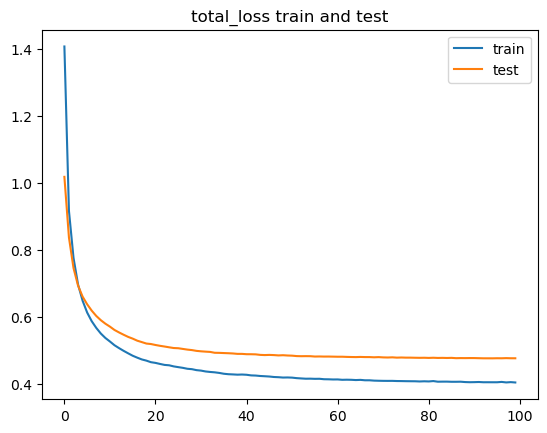

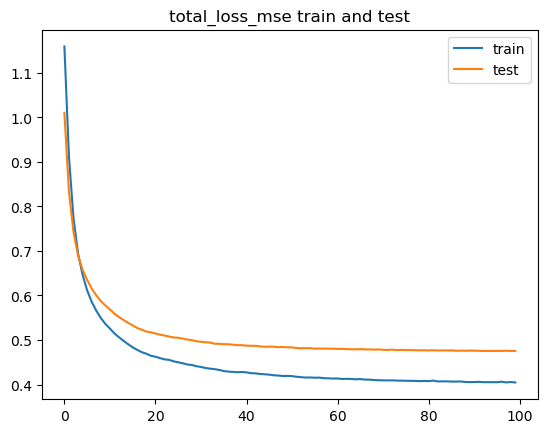

In [100]:
plt.plot(L1,label='train')
plt.plot(L2,label='test' )
plt.title("total_loss train and test")
plt.legend()
plt.show()
plt.plot(list_t_mse,label='train')
plt.plot(list_v_mse,label='test' )
plt.title("total_loss_mse train and test")
plt.legend()
plt.show()


torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


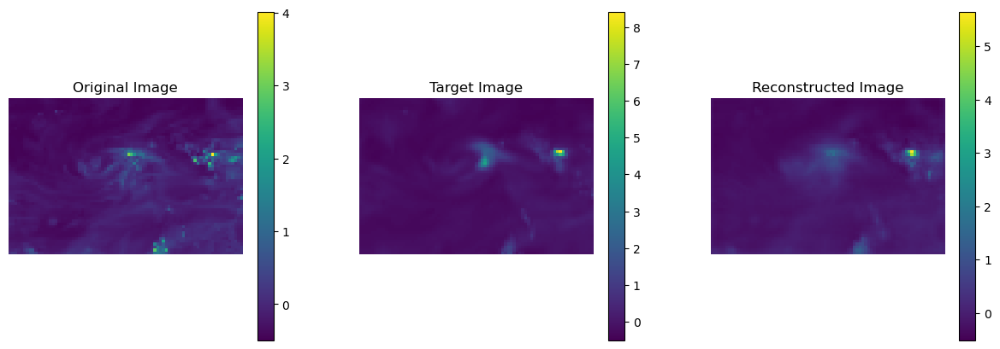

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


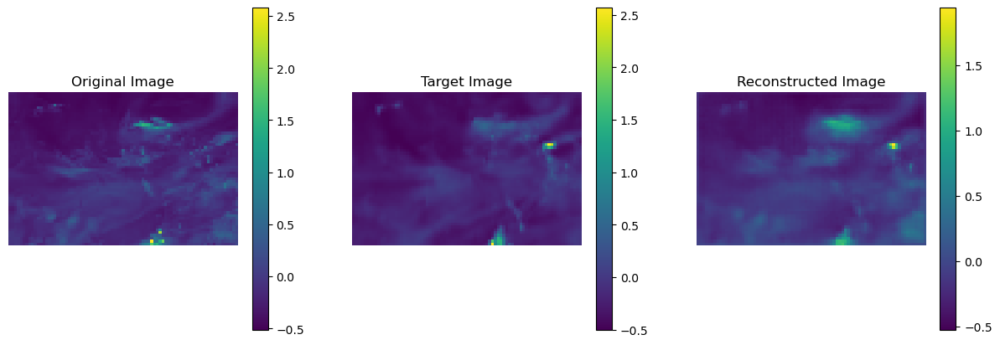

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


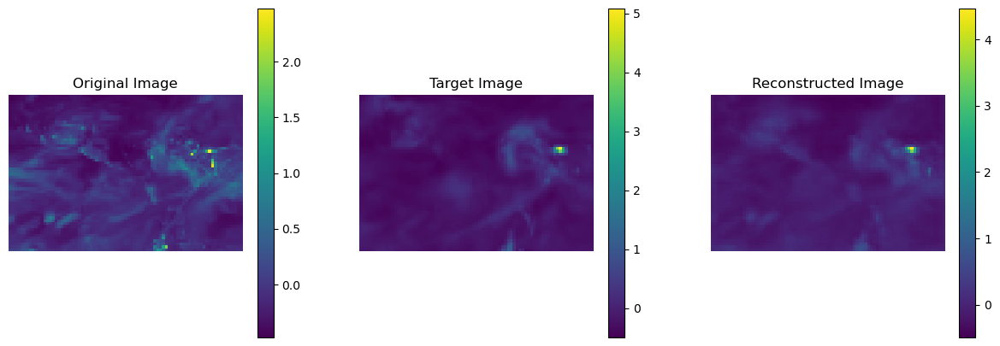

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


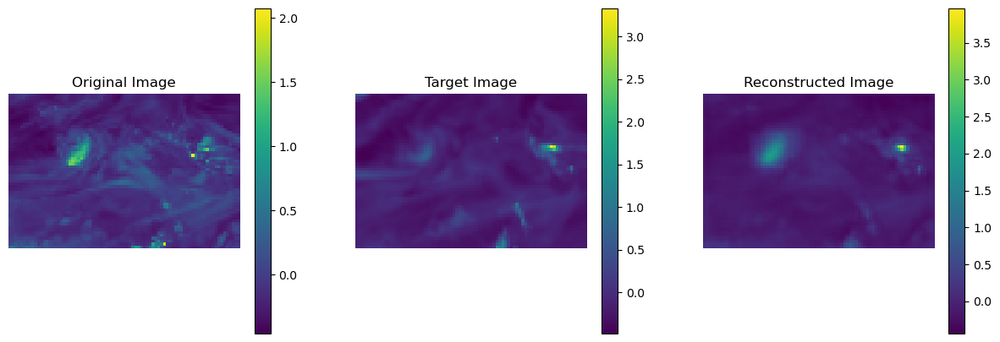

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


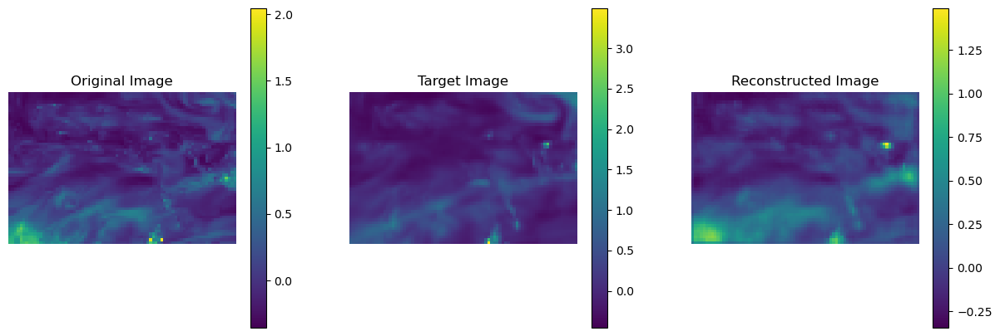

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


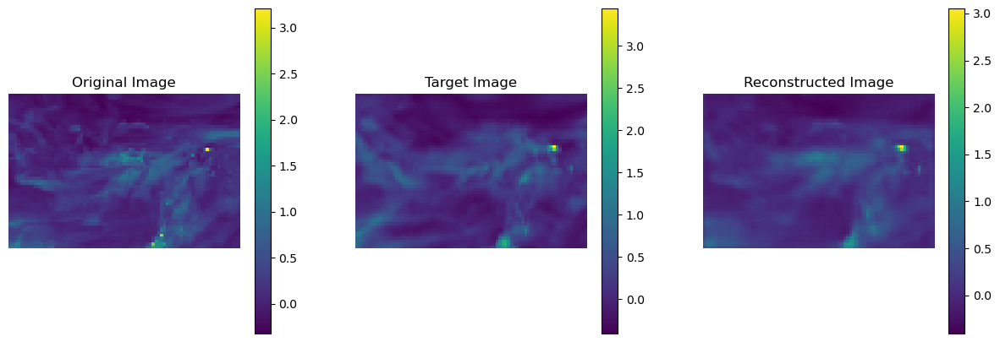

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


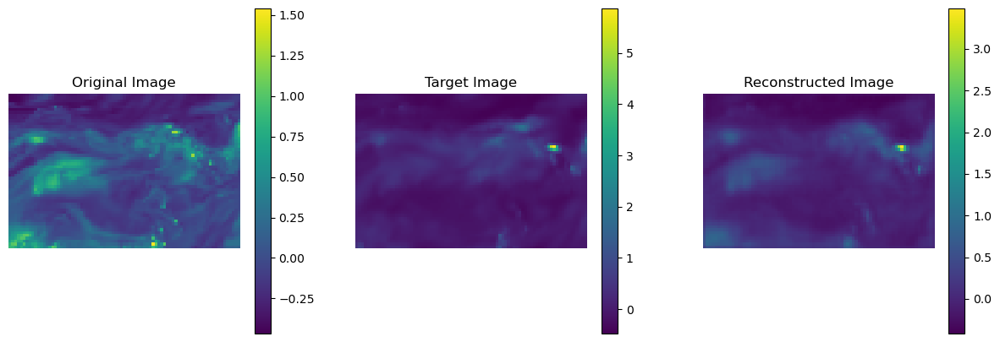

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


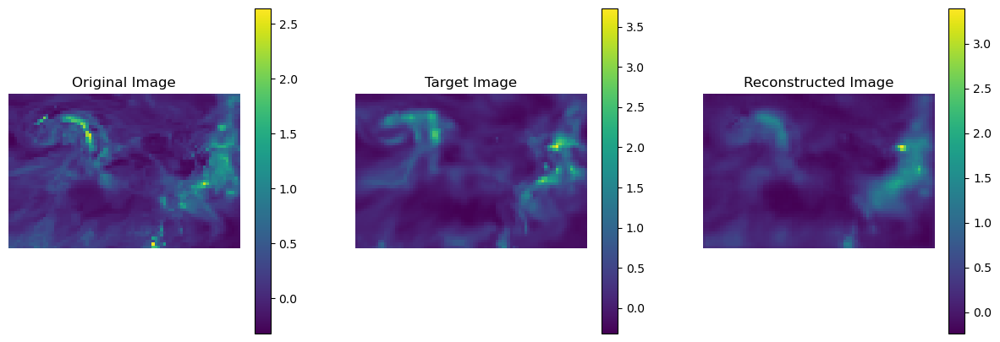

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


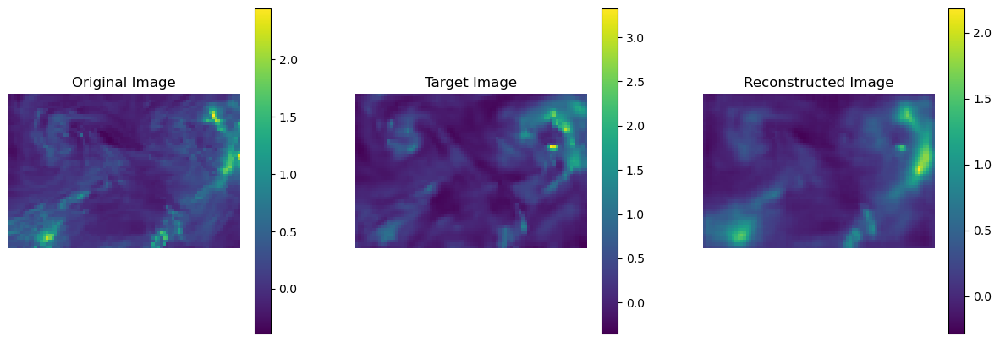

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


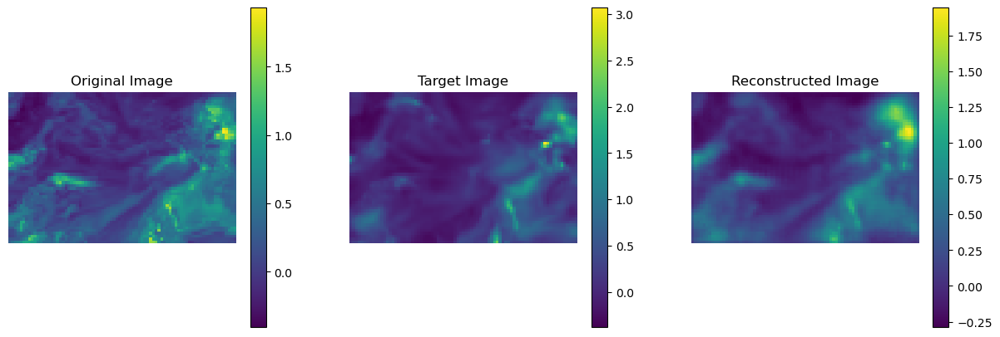

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


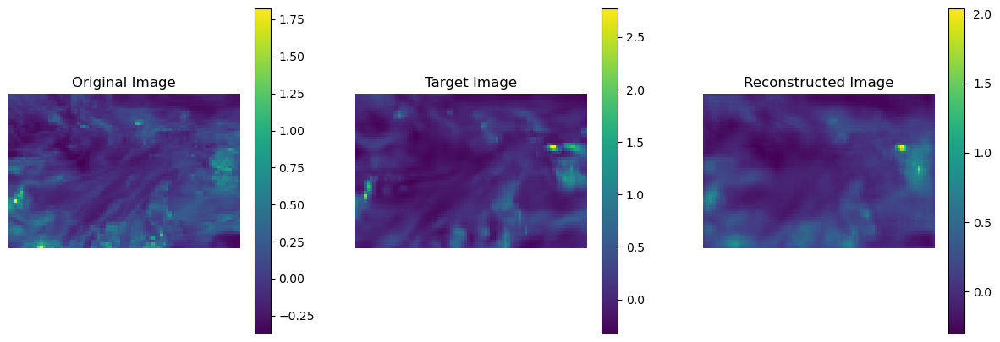

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


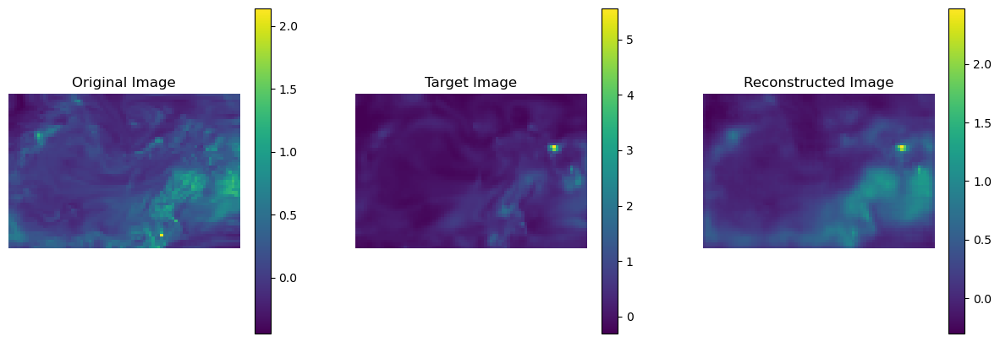

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


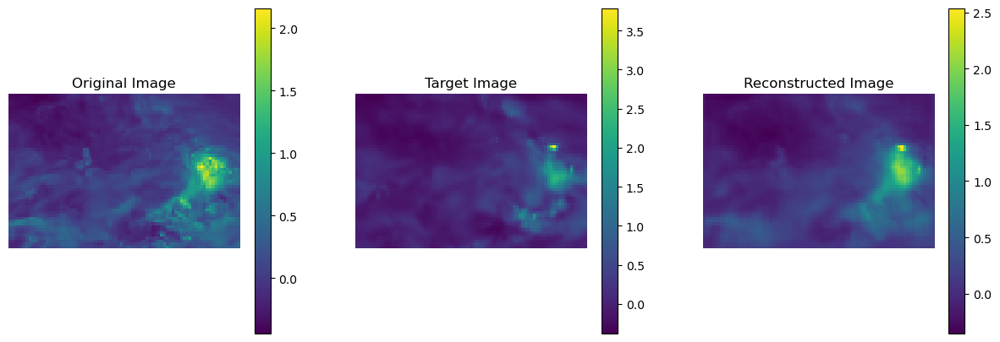

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


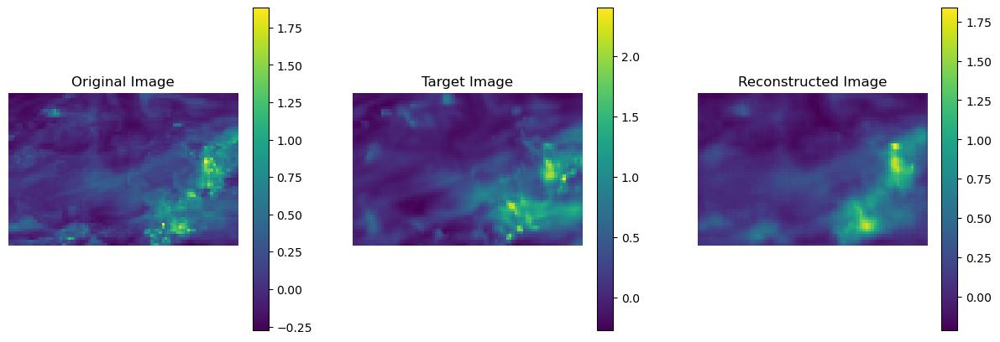

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


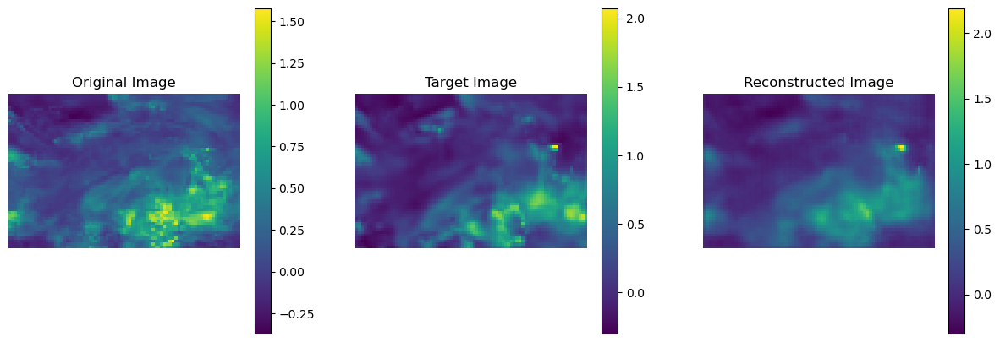

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


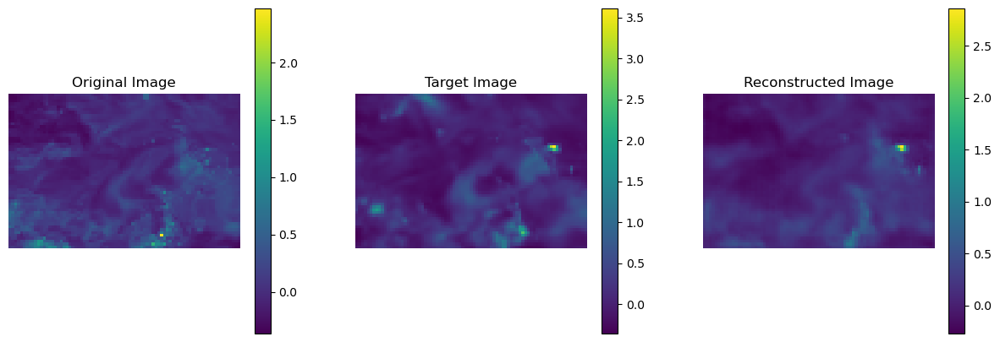

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


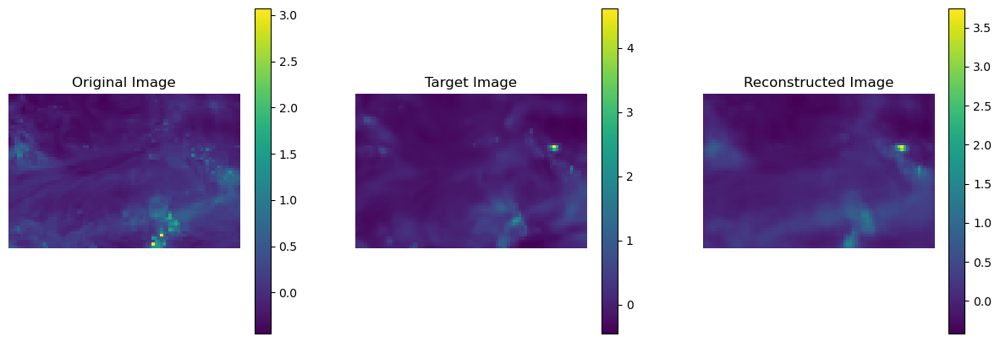

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


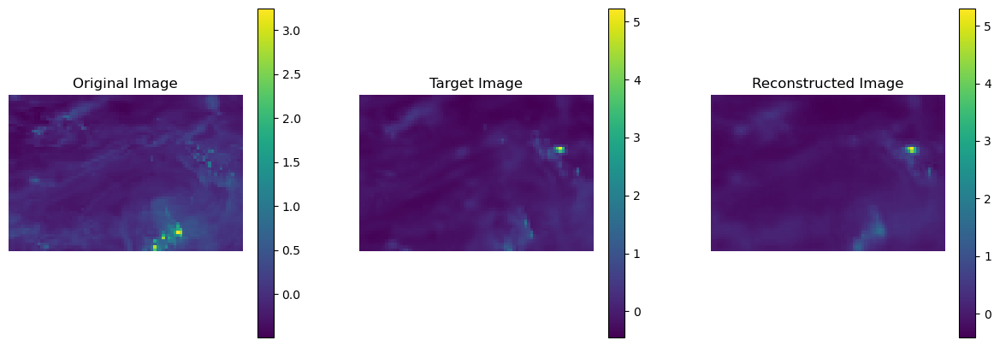

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


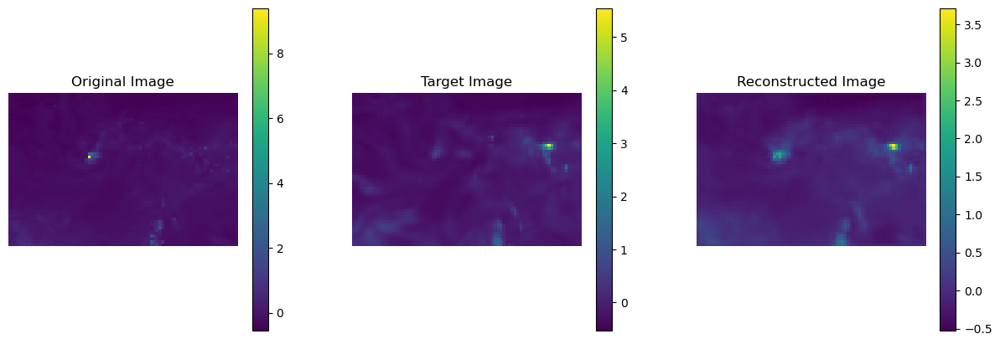

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


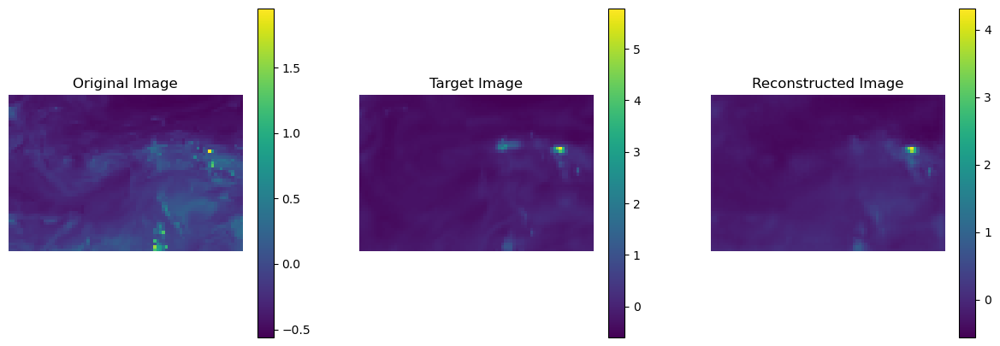

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


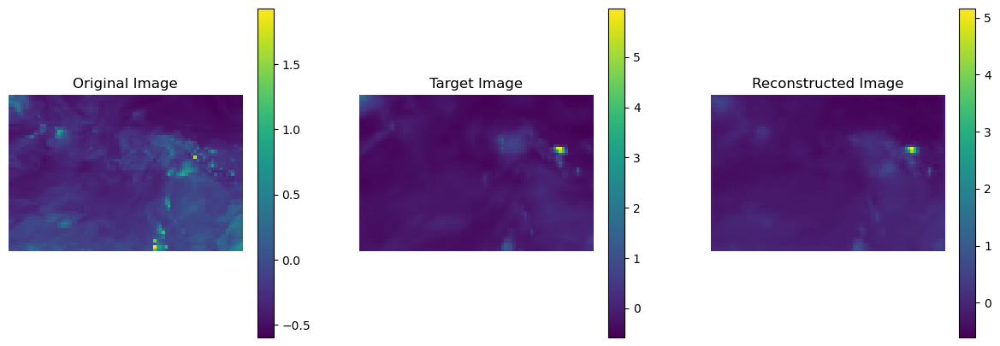

torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])
torch.Size([32, 51, 54, 81])


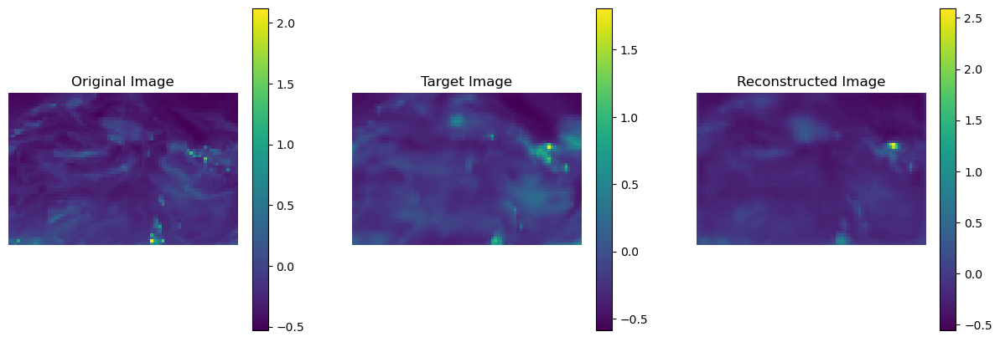

torch.Size([26, 51, 54, 81])
torch.Size([26, 51, 54, 81])
torch.Size([26, 51, 54, 81])


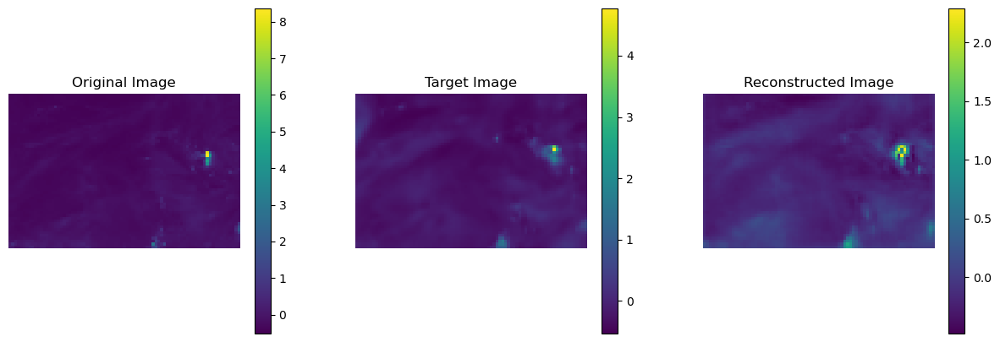

In [101]:
di=iter(val_dataloader)
for x in di:
    print(x[0].shape)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5)) 

    im0 = axs[0].imshow(x[0][0].mean(0))
    axs[0].set_title('Original Image')
    axs[0].axis('off')
    plt.colorbar(im0, ax=axs[0])

    im1 = axs[1].imshow(x[1][0].mean(0))
    axs[1].set_title('Target Image')
    axs[1].axis('off')
    plt.colorbar(im1, ax=axs[1])

    with torch.no_grad():
        ch=[i for i in range(17)]
        y = x[0].to(device)
        print(y.shape)
        output_images = model_vae(y)[0]
        print(output_images.shape)
        
    im2 = axs[2].imshow(output_images[0, :].mean(0).cpu())
    axs[2].set_title('Reconstructed Image')
    axs[2].axis('off')
    plt.colorbar(im2, ax=axs[2])

    plt.show()

# dust prediction

In [33]:
dates_rea_fore = timestamps_rea.union(timestamps_fore)
print(dates_rea_fore)
shared_timestamps_idxs, shared_timestamps = sync_timestamps([dates_rea_fore, # pd.DatetimeIndex vector of len raw_inputs.shape[0]
                                                             timestamps_labels]) # pd.DatetimeIndex vector of len raw_outputs.shape[0]
len(shared_timestamps_idxs[0])

DatetimeIndex(['2003-01-02 00:00:00+00:00', '2003-01-02 12:00:00+00:00',
               '2003-01-03 00:00:00+00:00', '2003-01-03 12:00:00+00:00',
               '2003-01-04 00:00:00+00:00', '2003-01-04 12:00:00+00:00',
               '2003-01-05 00:00:00+00:00', '2003-01-05 12:00:00+00:00',
               '2003-01-06 00:00:00+00:00', '2003-01-06 12:00:00+00:00',
               ...
               '2023-05-19 00:00:00+00:00', '2023-05-19 12:00:00+00:00',
               '2023-05-20 00:00:00+00:00', '2023-05-20 12:00:00+00:00',
               '2023-05-21 00:00:00+00:00', '2023-05-21 12:00:00+00:00',
               '2023-05-22 00:00:00+00:00', '2023-05-22 12:00:00+00:00',
               '2023-05-23 00:00:00+00:00', '2023-05-23 12:00:00+00:00'],
              dtype='datetime64[ns, UTC]', length=14894, freq='12H')


  0%|          | 0/2 [00:00<?, ?it/s]

13148

## Dust prediction

## cams results are: 
### accuracy - 66%
### precision - 14.5
### recall - 56 
### (precision_recall)/2 = 30% 

In [102]:
class encoder_decoder_dataset(Dataset):
    def __init__(self, data_fore, data_rea,labels_all, shared_timestamps ,pressure=0,selected_channels=[],
                 selected_levels=[],time=24,boundaries=torch.tensor([0, 65])):
        
    
        self.data_fore = data_fore
        self.data_rea = data_rea
        self.label_all=labels_all
        self.shared_timestamps=timestamps_rea
        self.time=time
        self.pressure=pressure
        self.boundaries=boundaries
        print(self.data_fore.shape)
        
        self.data_fore=self.data_fore[:,:,0]
        if len(selected_channels)!=0:
            self.data_fore=self.data_fore[:,selected_channels]
            self.data_rea=self.data_rea[:,selected_channels]
            
        self.data_fore = rearrange(self.data_fore, 'b c le h w -> b (c le) h w') 
        self.data_rea = rearrange(self.data_rea, 'b c le h w -> b (c le) h w') 
        print(self.data_fore.shape,self.data_rea.shape)
        
        
#         #norm by channels and model levels:
#         means_rea = self.data_rea.mean([0,2,3])[None,:,None,None]
#         means_fore = self.data_fore.mean([0,2,3])[None,:,None,None]

#         std_rea = self.data_rea.std([0,2,3])[None,:,None,None]
#         std_fore = self.data_fore.std([0,2,3])[None,:,None,None]

#         self.data_rea_scaled = (self.data_rea - means_rea)/std_rea
#         self.data_fore_scaled = (self.data_fore - means_fore)/std_fore

        stn_idx_30 = [  0,   6,   8,   9,  11,  14,  16,  21,  25,  27,  31,  32,  41, 45,  46,  48, 49,  52,  53,  61,  62,  68,  73,  80,  84,  88,  94,  99, 103, 107]
        self.labes_all=self.label_all[:,stn_idx_30,:,:]
        self.label_all[self.label_all<0]=torch.nan
        if self.time==0:
            self.label=self.label_all[:,:,0,0]
            self.label=torch.nanmean(self.label,dim=1)
        else:
            self.time_index=int(56 + self.time // 3)
            self.label=self.label_all[:,:,0,self.time_index]
            self.label=torch.nanmean(self.label,dim=1)
            
        
        #labels
        self.label = torch.where(torch.isnan(self.label), torch.tensor(-1), self.label)
        self.labels_classes = torch.bucketize(self.label, self.boundaries, right=True)
        
    def __len__(self):
        return self.data_fore.shape[0]
    
    def __getitem__(self, idx):
        
        fore=self.data_fore[idx]
        rea=self.data_rea[idx]
        idx_label=shared_timestamps_idxs[1][idx]
        label=self.labels_classes[idx_label]
        return fore, rea, label ,str(self.shared_timestamps[idx])

In [103]:
def train_enc_dec(epochs,decoder,optimizer,scheduler,channels_train,channels_valid):
    list_t=[]
    list_t_mse=[]
    list_v=[]
    list_v_mse=[]
    min_lr = 4e-07
    for epoch in range(epochs):
        num_batches=0
        loss_total=0
        mse_total=0
        for forecast, reanalysis,timestamp in tqdm(train_dataloader):
            num_batches+=1
            forecast=forecast #only for 1 model level and one channel
            reanalysis=reanalysis
            forecast=forecast.to(device)
            reanalysis=reanalysis.to(device)
            optimizer.zero_grad()


            recon_forecast, mu, logvar = model(forecast)
            loss,mse = loss_function_mse(recon_forecast, reanalysis, mu, logvar)
            
            loss.backward()

            loss_total+=loss.item()
            mse_total+=mse.item()
            optimizer.step()
        scheduler.step()
        for param_group in optimizer.param_groups:
            if param_group['lr'] < min_lr:
                param_group['lr'] = min_lr
        list_t.append(loss_total/num_batches)
        list_t_mse.append(mse_total/num_batches)
        print(f"Epoch {epoch+1}, Loss: {loss_total/num_batches},mse_loss: {mse_total/num_batches}")
        with torch.no_grad():
            loss_val=0
            running_loss_val=0
            num_batches=0
            loss_mse_val=0
            for forecast, reanalysis,timestamp in tqdm(val_dataloader):
                num_batches+=1


                forecast=forecast.to(device)
                reanalysis=reanalysis.to(device)

                recon_forecast, mu, logvar = model(forecast)
                loss,mse = loss_function_mse(recon_forecast, reanalysis, mu, logvar)

                running_loss_val += loss.item()
                loss_mse_val+=mse.item()
            list_v_mse.append(loss_mse_val/num_batches)    
            list_v.append(running_loss_val/num_batches)
            print(f'loss_val: {running_loss_val/num_batches}, mse_val_loss: {loss_mse_val/num_batches}')
    return list_t,list_v,list_t_mse,list_v_mse
    

In [104]:
full_dataset = encoder_decoder_dataset(data_fore_with_zeros,data_rea_with_zeros, labels_all,shared_timestamps_idxs,shared_timestamps,time=24)

# Split the dataset based on years|
# test_years = [2019, 2020]  # Years to be included in the training set
# train_years = [year for year in range(2003, 2021) if year not in test_years]  # Remaining years for testing
index_2017=np.where(meta_data_rea["timestamps"].year==2017)[0]
index_2020=np.where(meta_data_rea["timestamps"].year==2020)[0]
index_2021=np.where(meta_data_rea["timestamps"].year==2021)[0]

train_dataset = [full_dataset[i] for i in range(index_2017[0],index_2020[0])]
print(1)
test_dataset = [full_dataset[i] for i in range(index_2020[0],index_2021[0]-4)]

torch.Size([14894, 17, 3, 3, 54, 81])
torch.Size([14894, 51, 54, 81]) torch.Size([14894, 51, 54, 81])
1


In [105]:
def count_labels(dataset, num_classes):
    class_counts = {i: 0 for i in range(num_classes)}

    for data in dataset:
        input_target, input_source, label, time = data
        # Increment the count for the class (label)
        class_counts[int(label)] += 1


    return class_counts

count_train=list(count_labels(train_dataset,3).values())
count_test=list(count_labels(test_dataset,3).values())
count_train,count_test

([5, 1919, 266], [1, 675, 52])

In [106]:
class_weight_train=[(1/(5*count_train[0])),(1/count_train[1]),(1/count_train[2])]


def weights(dataset,class_weight):
    weights_sum=[]
    for x in dataset:
        input_target, input_source, label, time=x
        z=label.item()
        weights_sum.append(class_weight[z])
    return weights_sum

weights_train=weights(train_dataset,class_weight_train)


sampler_train=WeightedRandomSampler(weights=weights_train, num_samples=len(weights_train))
batch_size=16

train_dataloader = DataLoader(train_dataset, batch_size=batch_size,sampler=sampler_train)#,shuffle=True)#,sampler=sampler_train)
val_dataloader = DataLoader(test_dataset, batch_size=batch_size)

In [107]:
class resnet_same(nn.Module):
    def __init__(self,in_channels,act=nn.GELU()):
        super(resnet_same, self).__init__()
        self.in_channels = in_channels
        self.bn1 = nn.BatchNorm2d(in_channels)        
        self.bn2 = nn.BatchNorm2d(in_channels)        
        self.act = act
        self.conv1 = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
       
    def forward(self,x):
        residual = x    
        
        out = self.bn1(x)
        out = self.act(out)
        out = self.conv1(out)
        out += residual        
        out = self.bn2(out)
        out = self.act(out)
        out = self.conv2(out)
        out += residual       

        return out
    
class ResBlock_reduce(nn.Module):
    def __init__(self, in_channels, out_channels, act=nn.GELU()):
        super(ResBlock_reduce, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.bn1 = nn.BatchNorm2d(in_channels)        
        self.bn2 = nn.BatchNorm2d(out_channels)        
        self.act = act
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
       
        # Ensure that residual connection has the same dimensions
        if in_channels != out_channels:
            self.residual_conv = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0)
        else:
            self.residual_conv = None

    def forward(self, x):
        residual = x
        if self.residual_conv:
            residual = self.residual_conv(x)
        
        out = self.bn1(x)
        out = self.act(out)
        out = self.conv1(out)
        out += residual        
        out = self.bn2(out)
        out = self.act(out)
        out = self.conv2(out)
        out += residual       

        return out

In [148]:
class cnn_encoder(nn.Module):
    def __init__(self,n,output_linear):
        super(cnn_encoder, self).__init__()
        self.enc_conv1 = nn.Conv2d(51, 54, kernel_size=4, stride=2, padding=1) 
        self.resnet_same1 = resnet_same(54)
        self.resnet_1 = ResBlock_reduce(54,62)
        self.enc_conv2 = nn.Conv2d(62, 68, kernel_size=4, stride=2, padding=1)  
        self.enc_conv3 = nn.Conv2d(68, 82, kernel_size=4, stride=2, padding=1)
        self.resnet_same2 = resnet_same(82)
        self.resnet_2 = ResBlock_reduce(82,96)
        self.enc_conv4 = nn.Conv2d(96, 108, kernel_size=4, stride=2, padding=1)
        self.resnet_same3 = resnet_same(108)
        self.resnet_3 = ResBlock_reduce(108,120)
        self.enc_conv5 = nn.Conv2d(120+51, 136, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(136*54*81, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc2_pred = nn.Linear(128, 3)
        
    def forward(self, x, grl_lambda=1.0):
        insert = x.clone()
        h1 = torch.relu(self.enc_conv1(x))
        h1 = self.resnet_same1(h1)
        h1 = self.resnet_1(h1)
        h2 = torch.relu(self.enc_conv2(h1))
        h3 = torch.relu(self.enc_conv3(h2))
        h3 = self.resnet_same2(h3)
        h3 = self.resnet_2(h3)
        h4 = torch.relu(self.enc_conv4(h3))
        h4 = self.resnet_same3(h4)
        h4 = self.resnet_3(h4)
        padded_image1 = F.pad(h4, (0, insert.shape[3]-h4.shape[3], 0, insert.shape[2]-h4.shape[2]))
        padded_image1=torch.cat((padded_image1,insert),dim=1)
        h4 = torch.relu(self.enc_conv5(padded_image1))
        h = h4.view(-1,  136*54*81)
        h = torch.relu(self.fc1(h))
        h = torch.relu(self.fc2(h))
        return self.fc2_pred(h)

In [149]:
def train_enc_dec(epochs,model_vae,model_dust,optimizer,scheduler,channels_train,channels_valid):
    list_t=[]
    list_t_mse=[]
    list_v=[]
    list_v_mse=[]
    min_lr = 8e-07
    for epoch in range(epochs):
        num_batches=0
        loss_total=0
        mse_total=0
        dust_total=0
        loss_vae,mse_vae=0,0
        for forecast, reanalysis,labels,timestamp in tqdm(train_dataloader):
            num_batches+=1
             #only for 1 model level and one channel
            forecast=forecast.to(device)
            reanalysis=reanalysis.to(device)
            labels=labels.to(device)
            optimizer.zero_grad()
            
            with torch.no_grad():
                data_pred, mu, logvar=model_vae(forecast)

                
            dust_pred = model_dust(data_pred)
            
            loss_dust = loss_cross(dust_pred,labels).mean()

            loss_dust.backward()

            loss_total+=loss_dust.item()
            optimizer.step()
                
            optimizer.step()
    
        scheduler.step()
        for param_group in optimizer.param_groups:
            if param_group['lr'] < min_lr:
                param_group['lr'] = min_lr
        list_t.append(loss_total/num_batches)
        list_t_mse.append(mse_total/num_batches)
        print(f"Epoch {epoch+1}, Loss: {loss_total/num_batches}")
        with torch.no_grad():
            loss_val=0
            running_loss_val=0
            num_batches=0
            loss_mse_val=0
            true_positive_target=0
            false_positive_target=0
            false_negative_target=0
            true_negative_target=0
            for forecast, reanalysis,labels,timestamp in tqdm(val_dataloader):

                forecast=forecast.to(device)
                reanalysis=reanalysis.to(device)
                labels=labels.to(device)
                with torch.no_grad():
                    recon_forecast, mu, logvar = model_vae(forecast)
                dust_pred = model_dust(recon_forecast)
                _, predicted = torch.max(dust_pred.data, 1)
                true_positive_target += ((predicted == labels) & (labels == 2)).sum().item()
                false_positive_target += ((predicted != labels) & (labels == 1)).sum().item()
                false_negative_target += ((predicted != labels) & (labels == 2)).sum().item()
                true_negative_target += ((predicted == labels) & (labels == 1)).sum().item()
            print(f'true_pos: {true_positive_target},true_neg: {true_negative_target},false_pos:{false_positive_target},false_neg:{false_negative_target}')
            if((true_positive_target + false_positive_target)):
                precision_target = 100 * true_positive_target / (true_positive_target + false_positive_target)  # precision
            else:
                precision_target=torch.tensor([float('nan')])
            recall=  100 * true_positive_target / (true_positive_target + false_negative_target)
            accuracy=100 * (true_positive_target+true_negative_target) / (true_positive_target + false_negative_target+ true_negative_target + false_positive_target)
            recall_precision_avg=((recall+precision_target)/2)
            print(f'acc: {accuracy},precision: {precision_target}, recall: {recall}, recall_pre_avg: {recall_precision_avg}')
            print()
    return precision_target,recall,recall_precision_avg

In [152]:
num_epochs=100
model_dust = cnn_encoder(17,3).to(device)
weights_tensor = torch.tensor([0,1.5,1], dtype=torch.float32).to(device)
loss_cross = nn.CrossEntropyLoss(weight=weights_tensor, reduction='none')
learning_rate = 0.0001

optimizer = optim.Adam(model_dust.parameters(), lr=learning_rate)

channels_train=[x for x in range(17)]
scheduler = StepLR(optimizer, step_size=10, gamma=0.5,verbose=True)

precision_target,recall,recall_precision_avg=train_enc_dec(num_epochs,model_vae,model_dust,optimizer,scheduler,channels_train,channels_train)

Adjusting learning rate of group 0 to 1.0000e-04.


  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 1, Loss: 9.045684777472141


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 0,true_neg: 675,false_pos:0,false_neg:52
acc: 92.84731774415405,precision: tensor([nan]), recall: 0.0, recall_pre_avg: tensor([nan])



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 2, Loss: 0.7858923373431185


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 0,true_neg: 675,false_pos:0,false_neg:52
acc: 92.84731774415405,precision: tensor([nan]), recall: 0.0, recall_pre_avg: tensor([nan])



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 3, Loss: 0.7417956766855978


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 17,true_neg: 524,false_pos:151,false_neg:35
acc: 74.41540577716644,precision: 10.119047619047619, recall: 32.69230769230769, recall_pre_avg: 21.405677655677657



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 4, Loss: 0.6742198410695487


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 50,true_neg: 38,false_pos:637,false_neg:2
acc: 12.104539202200826,precision: 7.27802037845706, recall: 96.15384615384616, recall_pre_avg: 51.71593326615161



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 5, Loss: 0.6537699560179328


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 16,true_neg: 629,false_pos:46,false_neg:36
acc: 88.72077028885832,precision: 25.806451612903224, recall: 30.76923076923077, recall_pre_avg: 28.287841191066995



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 6, Loss: 0.6469341242400399


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 10,true_neg: 661,false_pos:14,false_neg:42
acc: 92.29711141678129,precision: 41.666666666666664, recall: 19.23076923076923, recall_pre_avg: 30.44871794871795



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 7, Loss: 0.5506137763931803


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 28,true_neg: 566,false_pos:109,false_neg:24
acc: 81.70563961485557,precision: 20.437956204379564, recall: 53.84615384615385, recall_pre_avg: 37.14205502526671



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 8, Loss: 0.5779832167564517


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 1,true_neg: 672,false_pos:3,false_neg:51
acc: 92.57221458046767,precision: 25.0, recall: 1.9230769230769231, recall_pre_avg: 13.461538461538462



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.0000e-04.
Epoch 9, Loss: 0.6002314519273103


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 462,false_pos:213,false_neg:18
acc: 68.22558459422284,precision: 13.765182186234817, recall: 65.38461538461539, recall_pre_avg: 39.574898785425106



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 10, Loss: 0.6058954107065271


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 36,true_neg: 442,false_pos:233,false_neg:16
acc: 65.74965612104539,precision: 13.382899628252789, recall: 69.23076923076923, recall_pre_avg: 41.30683442951101



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 11, Loss: 0.5080072779725068


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 33,true_neg: 435,false_pos:240,false_neg:19
acc: 64.37414030261348,precision: 12.087912087912088, recall: 63.46153846153846, recall_pre_avg: 37.77472527472527



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 12, Loss: 0.5220142793263832


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 477,false_pos:198,false_neg:22
acc: 69.73865199449794,precision: 13.157894736842104, recall: 57.69230769230769, recall_pre_avg: 35.4251012145749



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 13, Loss: 0.49017372673010307


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 407,false_pos:268,false_neg:20
acc: 60.38514442916094,precision: 10.666666666666666, recall: 61.53846153846154, recall_pre_avg: 36.1025641025641



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 14, Loss: 0.5371621960271014


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 38,true_neg: 414,false_pos:261,false_neg:14
acc: 62.17331499312242,precision: 12.709030100334449, recall: 73.07692307692308, recall_pre_avg: 42.89297658862876



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 15, Loss: 0.5335328763853895


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 43,true_neg: 357,false_pos:318,false_neg:9
acc: 55.02063273727648,precision: 11.911357340720222, recall: 82.6923076923077, recall_pre_avg: 47.301832516513954



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 16, Loss: 0.49667272482910296


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 41,true_neg: 370,false_pos:305,false_neg:11
acc: 56.533700137551584,precision: 11.84971098265896, recall: 78.84615384615384, recall_pre_avg: 45.3479324144064



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 17, Loss: 0.4859345421521333


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 406,false_pos:269,false_neg:13
acc: 61.21045392022008,precision: 12.662337662337663, recall: 75.0, recall_pre_avg: 43.83116883116883



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 18, Loss: 0.4697472004994859


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 40,true_neg: 414,false_pos:261,false_neg:12
acc: 62.448418156808806,precision: 13.289036544850498, recall: 76.92307692307692, recall_pre_avg: 45.10605673396371



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 5.0000e-05.
Epoch 19, Loss: 0.45769762753570165


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 40,true_neg: 391,false_pos:284,false_neg:12
acc: 59.284731774415405,precision: 12.345679012345679, recall: 76.92307692307692, recall_pre_avg: 44.6343779677113



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 20, Loss: 0.4751613150982961


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 434,false_pos:241,false_neg:13
acc: 65.06189821182943,precision: 13.928571428571429, recall: 75.0, recall_pre_avg: 44.464285714285715



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 21, Loss: 0.4859243541085807


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 435,false_pos:240,false_neg:13
acc: 65.19944979367263,precision: 13.978494623655914, recall: 75.0, recall_pre_avg: 44.48924731182796



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 22, Loss: 0.43369221730823937


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 43,true_neg: 413,false_pos:262,false_neg:9
acc: 62.72352132049519,precision: 14.098360655737705, recall: 82.6923076923077, recall_pre_avg: 48.3953341740227



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 23, Loss: 0.43730677729540496


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 452,false_pos:223,false_neg:18
acc: 66.85006877579092,precision: 13.229571984435797, recall: 65.38461538461539, recall_pre_avg: 39.30709368452559



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 24, Loss: 0.44680024074376934


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 430,false_pos:245,false_neg:13
acc: 64.51169188445667,precision: 13.732394366197184, recall: 75.0, recall_pre_avg: 44.36619718309859



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 25, Loss: 0.44343836159601696


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 41,true_neg: 418,false_pos:257,false_neg:11
acc: 63.13617606602476,precision: 13.758389261744966, recall: 78.84615384615384, recall_pre_avg: 46.3022715539494



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 26, Loss: 0.43197176110570445


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 451,false_pos:224,false_neg:17
acc: 66.85006877579092,precision: 13.513513513513514, recall: 67.3076923076923, recall_pre_avg: 40.41060291060291



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 27, Loss: 0.44740299543325046


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 453,false_pos:222,false_neg:17
acc: 67.1251719394773,precision: 13.618677042801556, recall: 67.3076923076923, recall_pre_avg: 40.46318467524693



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 28, Loss: 0.44484171847792436


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 38,true_neg: 447,false_pos:228,false_neg:14
acc: 66.71251719394773,precision: 14.285714285714286, recall: 73.07692307692308, recall_pre_avg: 43.681318681318686



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.5000e-05.
Epoch 29, Loss: 0.41977644042812123


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 451,false_pos:224,false_neg:17
acc: 66.85006877579092,precision: 13.513513513513514, recall: 67.3076923076923, recall_pre_avg: 40.41060291060291



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 30, Loss: 0.43030210959650306


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 451,false_pos:224,false_neg:17
acc: 66.85006877579092,precision: 13.513513513513514, recall: 67.3076923076923, recall_pre_avg: 40.41060291060291



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 31, Loss: 0.4260643391061003


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 455,false_pos:220,false_neg:18
acc: 67.2627235213205,precision: 13.385826771653543, recall: 65.38461538461539, recall_pre_avg: 39.385221078134464



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 32, Loss: 0.43869583874288265


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 477,false_pos:198,false_neg:20
acc: 70.01375515818432,precision: 13.91304347826087, recall: 61.53846153846154, recall_pre_avg: 37.725752508361204



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 33, Loss: 0.41230457966780143


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 37,true_neg: 456,false_pos:219,false_neg:15
acc: 67.81292984869326,precision: 14.453125, recall: 71.15384615384616, recall_pre_avg: 42.80348557692308



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 34, Loss: 0.42347312952480176


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 471,false_pos:204,false_neg:17
acc: 69.60110041265474,precision: 14.644351464435147, recall: 67.3076923076923, recall_pre_avg: 40.97602188606373



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 35, Loss: 0.4202483861985868


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 433,false_pos:242,false_neg:13
acc: 64.92434662998625,precision: 13.87900355871886, recall: 75.0, recall_pre_avg: 44.43950177935943



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 36, Loss: 0.3948877761616324


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 450,false_pos:225,false_neg:17
acc: 66.71251719394773,precision: 13.461538461538462, recall: 67.3076923076923, recall_pre_avg: 40.38461538461539



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 37, Loss: 0.39719972536511666


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 38,true_neg: 447,false_pos:228,false_neg:14
acc: 66.71251719394773,precision: 14.285714285714286, recall: 73.07692307692308, recall_pre_avg: 43.681318681318686



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 38, Loss: 0.3864403113614034


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 467,false_pos:208,false_neg:17
acc: 69.05089408528198,precision: 14.40329218106996, recall: 67.3076923076923, recall_pre_avg: 40.85549224438113



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.2500e-05.
Epoch 39, Loss: 0.4138080156306281


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 498,false_pos:177,false_neg:18
acc: 73.17744154057772,precision: 16.113744075829384, recall: 65.38461538461539, recall_pre_avg: 40.74917973022239



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 40, Loss: 0.3821500420135303


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 420,false_pos:255,false_neg:13
acc: 63.13617606602476,precision: 13.26530612244898, recall: 75.0, recall_pre_avg: 44.13265306122449



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 41, Loss: 0.391798278711138


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 477,false_pos:198,false_neg:17
acc: 70.42640990371389,precision: 15.021459227467812, recall: 67.3076923076923, recall_pre_avg: 41.16457576758006



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 42, Loss: 0.3828822731645438


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 484,false_pos:191,false_neg:18
acc: 71.25171939477303,precision: 15.11111111111111, recall: 65.38461538461539, recall_pre_avg: 40.24786324786325



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 43, Loss: 0.39093729973274427


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 466,false_pos:209,false_neg:18
acc: 68.7757909215956,precision: 13.991769547325102, recall: 65.38461538461539, recall_pre_avg: 39.688192465970246



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 44, Loss: 0.36078882826505787


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 33,true_neg: 509,false_pos:166,false_neg:19
acc: 74.55295735900962,precision: 16.582914572864322, recall: 63.46153846153846, recall_pre_avg: 40.02222651720139



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 45, Loss: 0.380994072088795


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 502,false_pos:173,false_neg:20
acc: 73.4525447042641,precision: 15.609756097560975, recall: 61.53846153846154, recall_pre_avg: 38.574108818011254



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 46, Loss: 0.37921809206587553


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 34,true_neg: 512,false_pos:163,false_neg:18
acc: 75.10316368638239,precision: 17.258883248730964, recall: 65.38461538461539, recall_pre_avg: 41.32174931667318



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 47, Loss: 0.352201325886876


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 33,true_neg: 485,false_pos:190,false_neg:19
acc: 71.25171939477303,precision: 14.798206278026905, recall: 63.46153846153846, recall_pre_avg: 39.12987236978268



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 48, Loss: 0.3701530238953385


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 518,false_pos:157,false_neg:21
acc: 75.51581843191197,precision: 16.48936170212766, recall: 59.61538461538461, recall_pre_avg: 38.05237315875614



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 6.2500e-06.
Epoch 49, Loss: 0.3610733246607502


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 35,true_neg: 510,false_pos:165,false_neg:17
acc: 74.9656121045392,precision: 17.5, recall: 67.3076923076923, recall_pre_avg: 42.40384615384615



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 50, Loss: 0.34922509058548584


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 39,true_neg: 463,false_pos:212,false_neg:13
acc: 69.05089408528198,precision: 15.53784860557769, recall: 75.0, recall_pre_avg: 45.26892430278885



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 51, Loss: 0.3485562997142764


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 505,false_pos:170,false_neg:21
acc: 73.72764786795048,precision: 15.422885572139304, recall: 59.61538461538461, recall_pre_avg: 37.51913509376196



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 52, Loss: 0.34961016797018746


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 514,false_pos:161,false_neg:20
acc: 75.10316368638239,precision: 16.580310880829014, recall: 61.53846153846154, recall_pre_avg: 39.059386209645275



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 53, Loss: 0.3400967819956097


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 505,false_pos:170,false_neg:20
acc: 73.86519944979368,precision: 15.841584158415841, recall: 61.53846153846154, recall_pre_avg: 38.69002284843869



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 54, Loss: 0.3363749140152966


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 506,false_pos:169,false_neg:20
acc: 74.00275103163686,precision: 15.92039800995025, recall: 61.53846153846154, recall_pre_avg: 38.7294297742059



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 55, Loss: 0.37287448885014457


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 507,false_pos:168,false_neg:22
acc: 73.86519944979368,precision: 15.151515151515152, recall: 57.69230769230769, recall_pre_avg: 36.421911421911425



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 56, Loss: 0.33945852942275306


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 485,false_pos:190,false_neg:20
acc: 71.11416781292985,precision: 14.414414414414415, recall: 61.53846153846154, recall_pre_avg: 37.97643797643798



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 57, Loss: 0.31869164033092723


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 505,false_pos:170,false_neg:20
acc: 73.86519944979368,precision: 15.841584158415841, recall: 61.53846153846154, recall_pre_avg: 38.69002284843869



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 58, Loss: 0.3273630638736008


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 503,false_pos:172,false_neg:21
acc: 73.4525447042641,precision: 15.270935960591133, recall: 59.61538461538461, recall_pre_avg: 37.44316028798787



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 3.1250e-06.
Epoch 59, Loss: 0.3291748138076633


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 499,false_pos:176,false_neg:21
acc: 72.90233837689134,precision: 14.97584541062802, recall: 59.61538461538461, recall_pre_avg: 37.29561501300632



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 60, Loss: 0.34608070193416013


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 521,false_pos:154,false_neg:22
acc: 75.79092159559835,precision: 16.304347826086957, recall: 57.69230769230769, recall_pre_avg: 36.99832775919732



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 61, Loss: 0.31635867635699083


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 504,false_pos:171,false_neg:23
acc: 73.3149931224209,precision: 14.5, recall: 55.76923076923077, recall_pre_avg: 35.13461538461539



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 62, Loss: 0.3618520110791182


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 527,false_pos:148,false_neg:23
acc: 76.47867950481431,precision: 16.384180790960453, recall: 55.76923076923077, recall_pre_avg: 36.07670578009561



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 63, Loss: 0.34175772062183296


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 503,false_pos:172,false_neg:22
acc: 73.3149931224209,precision: 14.851485148514852, recall: 57.69230769230769, recall_pre_avg: 36.271896420411274



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 64, Loss: 0.34125978548596375


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 511,false_pos:164,false_neg:22
acc: 74.41540577716644,precision: 15.463917525773196, recall: 57.69230769230769, recall_pre_avg: 36.578112609040446



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 65, Loss: 0.3213561666164085


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 513,false_pos:162,false_neg:21
acc: 74.828060522696,precision: 16.06217616580311, recall: 59.61538461538461, recall_pre_avg: 37.83878039059386



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 66, Loss: 0.32205140857148346


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 506,false_pos:169,false_neg:23
acc: 73.5900962861073,precision: 14.646464646464647, recall: 55.76923076923077, recall_pre_avg: 35.207847707847705



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 67, Loss: 0.3174467933275839


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 516,false_pos:159,false_neg:21
acc: 75.24071526822559,precision: 16.31578947368421, recall: 59.61538461538461, recall_pre_avg: 37.96558704453441



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 68, Loss: 0.33679820420424433


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 515,false_pos:160,false_neg:21
acc: 75.10316368638239,precision: 16.230366492146597, recall: 59.61538461538461, recall_pre_avg: 37.92287555376561



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 1.5625e-06.
Epoch 69, Loss: 0.3364126621371638


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 519,false_pos:156,false_neg:22
acc: 75.51581843191197,precision: 16.129032258064516, recall: 57.69230769230769, recall_pre_avg: 36.9106699751861



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 7.8125e-07.
Epoch 70, Loss: 0.3055863673016973


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 506,false_pos:169,false_neg:21
acc: 73.86519944979368,precision: 15.5, recall: 59.61538461538461, recall_pre_avg: 37.55769230769231



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 71, Loss: 0.3048047242264678


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 502,false_pos:173,false_neg:20
acc: 73.4525447042641,precision: 15.609756097560975, recall: 61.53846153846154, recall_pre_avg: 38.574108818011254



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 72, Loss: 0.3040299163519466


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 510,false_pos:165,false_neg:22
acc: 74.27785419532324,precision: 15.384615384615385, recall: 57.69230769230769, recall_pre_avg: 36.53846153846154



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 73, Loss: 0.2888759974471844


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 27,true_neg: 511,false_pos:164,false_neg:25
acc: 74.00275103163686,precision: 14.136125654450261, recall: 51.92307692307692, recall_pre_avg: 33.02960128876359



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 74, Loss: 0.3201969733366566


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 33,true_neg: 504,false_pos:171,false_neg:19
acc: 73.86519944979368,precision: 16.176470588235293, recall: 63.46153846153846, recall_pre_avg: 39.81900452488688



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 75, Loss: 0.3034932360760052


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 512,false_pos:163,false_neg:20
acc: 74.828060522696,precision: 16.41025641025641, recall: 61.53846153846154, recall_pre_avg: 38.97435897435898



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 76, Loss: 0.3239118847316199


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 511,false_pos:164,false_neg:23
acc: 74.27785419532324,precision: 15.025906735751295, recall: 55.76923076923077, recall_pre_avg: 35.39756875249103



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 77, Loss: 0.3119604266146674


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 28,true_neg: 527,false_pos:148,false_neg:24
acc: 76.34112792297111,precision: 15.909090909090908, recall: 53.84615384615385, recall_pre_avg: 34.87762237762238



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 78, Loss: 0.3138354421205764


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 514,false_pos:161,false_neg:21
acc: 74.9656121045392,precision: 16.145833333333332, recall: 59.61538461538461, recall_pre_avg: 37.88060897435897



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 79, Loss: 0.3215980363642647


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 509,false_pos:166,false_neg:21
acc: 74.27785419532324,precision: 15.736040609137056, recall: 59.61538461538461, recall_pre_avg: 37.67571261226084



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 4.0000e-07.
Epoch 80, Loss: 0.31774523266910637


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 504,false_pos:171,false_neg:22
acc: 73.4525447042641,precision: 14.925373134328359, recall: 57.69230769230769, recall_pre_avg: 36.30884041331802



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 81, Loss: 0.31204460955558033


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 509,false_pos:166,false_neg:21
acc: 74.27785419532324,precision: 15.736040609137056, recall: 59.61538461538461, recall_pre_avg: 37.67571261226084



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 82, Loss: 0.3094232818723595


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 502,false_pos:173,false_neg:21
acc: 73.3149931224209,precision: 15.196078431372548, recall: 59.61538461538461, recall_pre_avg: 37.40573152337858



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 83, Loss: 0.31521523762902204


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 515,false_pos:160,false_neg:23
acc: 74.828060522696,precision: 15.343915343915343, recall: 55.76923076923077, recall_pre_avg: 35.55657305657306



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 84, Loss: 0.3295768360287821


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 513,false_pos:162,false_neg:23
acc: 74.55295735900962,precision: 15.18324607329843, recall: 55.76923076923077, recall_pre_avg: 35.4762384212646



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 85, Loss: 0.3140961082964918


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 515,false_pos:160,false_neg:21
acc: 75.10316368638239,precision: 16.230366492146597, recall: 59.61538461538461, recall_pre_avg: 37.92287555376561



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 86, Loss: 0.32503392658855795


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 515,false_pos:160,false_neg:23
acc: 74.828060522696,precision: 15.343915343915343, recall: 55.76923076923077, recall_pre_avg: 35.55657305657306



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 87, Loss: 0.30779881111896823


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 505,false_pos:170,false_neg:20
acc: 73.86519944979368,precision: 15.841584158415841, recall: 61.53846153846154, recall_pre_avg: 38.69002284843869



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 88, Loss: 0.3058103712914634


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 33,true_neg: 502,false_pos:173,false_neg:19
acc: 73.5900962861073,precision: 16.019417475728154, recall: 63.46153846153846, recall_pre_avg: 39.74047796863331



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 89, Loss: 0.3005634709703226


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 506,false_pos:169,false_neg:22
acc: 73.72764786795048,precision: 15.075376884422111, recall: 57.69230769230769, recall_pre_avg: 36.3838422883649



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 4.0000e-07.
Epoch 90, Loss: 0.3127352659502169


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 28,true_neg: 522,false_pos:153,false_neg:24
acc: 75.65337001375516,precision: 15.469613259668508, recall: 53.84615384615385, recall_pre_avg: 34.65788355291118



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 91, Loss: 0.2957252239278198


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 515,false_pos:160,false_neg:23
acc: 74.828060522696,precision: 15.343915343915343, recall: 55.76923076923077, recall_pre_avg: 35.55657305657306



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 92, Loss: 0.3068728017328429


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 31,true_neg: 509,false_pos:166,false_neg:21
acc: 74.27785419532324,precision: 15.736040609137056, recall: 59.61538461538461, recall_pre_avg: 37.67571261226084



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 93, Loss: 0.27851426663951284


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 26,true_neg: 522,false_pos:153,false_neg:26
acc: 75.37826685006877,precision: 14.525139664804469, recall: 50.0, recall_pre_avg: 32.262569832402235



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 94, Loss: 0.31108742778318643


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 30,true_neg: 521,false_pos:154,false_neg:22
acc: 75.79092159559835,precision: 16.304347826086957, recall: 57.69230769230769, recall_pre_avg: 36.99832775919732



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 95, Loss: 0.30571871642431203


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 517,false_pos:158,false_neg:23
acc: 75.10316368638239,precision: 15.508021390374331, recall: 55.76923076923077, recall_pre_avg: 35.63862607980255



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 96, Loss: 0.3165052767543897


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 32,true_neg: 500,false_pos:175,false_neg:20
acc: 73.17744154057772,precision: 15.458937198067632, recall: 61.53846153846154, recall_pre_avg: 38.49869936826459



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 97, Loss: 0.31324837381278514


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 28,true_neg: 519,false_pos:156,false_neg:24
acc: 75.24071526822559,precision: 15.217391304347826, recall: 53.84615384615385, recall_pre_avg: 34.531772575250834



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 98, Loss: 0.2874779291179058


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 521,false_pos:154,false_neg:23
acc: 75.65337001375516,precision: 15.846994535519126, recall: 55.76923076923077, recall_pre_avg: 35.808112652374945



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 8.0000e-07.
Epoch 99, Loss: 0.2819408125577182


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 29,true_neg: 524,false_pos:151,false_neg:23
acc: 76.06602475928473,precision: 16.11111111111111, recall: 55.76923076923077, recall_pre_avg: 35.94017094017094



  0%|          | 0/137 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 4.0000e-07.
Epoch 100, Loss: 0.29709078336175343


  0%|          | 0/46 [00:00<?, ?it/s]

true_pos: 28,true_neg: 512,false_pos:163,false_neg:24
acc: 74.27785419532324,precision: 14.659685863874346, recall: 53.84615384615385, recall_pre_avg: 34.2529198550141

